In [1]:
import edspdf

In [2]:
import sys
sys.path.append("..")

In [3]:
!ls ../../edspdf-train/data/publaynet/train/PMC1241820
# PMC1257602  --> count(44/293)  44/250 pmc_dir data/publaynet/xmls-bis/PMC1257602
# PMC1277862  --> count(10/57)  10/60 pmc_dir data/publaynet/xmls-bis/PMC1277862

ehp0112-000126.nxml  ehp0112-000126.pdf  pmc_data.pkl


In [4]:
import edspdf.pipes.classifiers.trainable_order_ba

In [5]:
model = edspdf.load("../../edspdf-train/artifacts/model-last-v0/")

/export/home/smbaye/edspdf-train/.venv/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# -----------TRAIN - DATA-----------
PMC1241820

Nb Pages 6


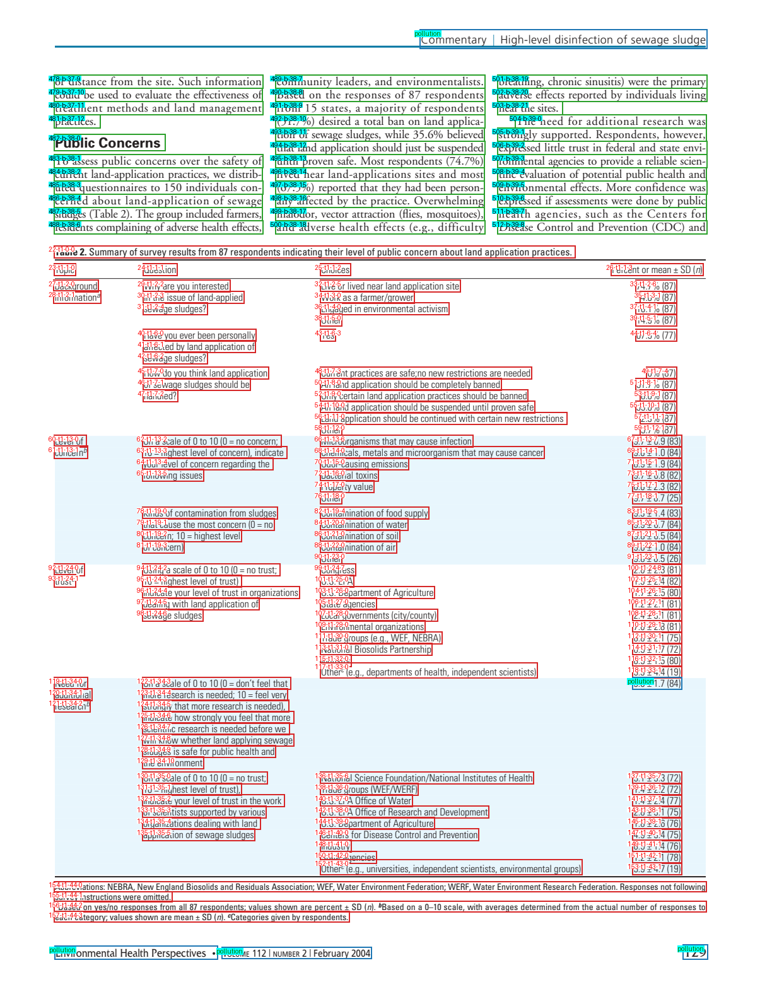

In [8]:
from edspdf.structures import TextBox
from edspdf.visualization.annotations import show_annotations
from pathlib import Path
import pickle as pk
from copy import deepcopy
from edspdf.structures import Box, PDFDoc
from edspdf.utils.alignment import align_box_labels_order_ba_pkl

# train
pmc_dir = '../../edspdf-train/data/publaynet/train/PMC1241820/'

# load the pkl file
def read_pdf_with_pkl(pmc_dir):
    pk_path = pmc_dir + 'pmc_data.pkl'
    with open(pk_path, 'rb') as file:
        pmc_data = pk.load(file)


    # boxes from pkl
    _boxes = [l for l in pmc_data['not_matched_lines']] # not matched as pollution
    flines = pmc_data['front_lines']
    blines = sorted(flines, key=lambda b: (b['node_num'], b['rank']))
    cpt = 0
    for b in flines:
        b['type_global_rank'] = cpt
        cpt += 1
    _boxes.extend(flines)
    blines = pmc_data['body_lines']
    blines = sorted(blines, key=lambda b: (b['node_num'], b['rank']))
    cpt = 0
    for b in blines:
        b['type_global_rank'] = cpt
        cpt += 1
    _boxes.extend(blines)
    tlines = pmc_data['table_lines']
    for l in tlines: # each table treated apart
        l['node_type'] = l['node_type'] + str(l['table_num'])
    tlines = sorted(tlines, key=lambda b: (b['table_num'],b['node_num'], b['rank']))
    cpt = 0
    for b in tlines:
        b['type_global_rank'] = cpt
        cpt += 1
    _boxes.extend(tlines)
    # _boxes = pmc_data['front_lines'] + pmc_data['body_lines'] + pmc_data['table_lines']
    src_boxes = []
    for _b in _boxes:
        b = Box(
            page_num = _b['page_num'],
            x0 = _b['x0'],
            x1 = _b['x1'],
            y0 = _b['y0'],
            y1 = _b['y1'],
            label = "pollution" if _b['label'] is None else _b['node_type'],
        )
        b.node_num = -1 if _b['label'] is None else _b['node_num']
        b.rank = -1 if _b['label'] is None else _b['rank']
        if _b['label'] is None:
            b.aff = f"pollution"
            b.color='green'
            b.bg_color='cyan'
        else:
            if _b['node_type'] == 'front':
                b.aff = f"{_b['type_global_rank']}-{_b['node_type'][0]}-{_b['node_num']}-{_b['rank']}"
                b.color='yellow'
                b.bg_color='black'
            if _b['node_type'] == 'body':
                b.aff = f"{_b['type_global_rank']}-{_b['node_type'][0]}-{_b['node_num']}-{_b['rank']}"
                b.color='black'
                b.bg_color='cyan'
            if _b['node_type'][:len('table')] == 'table':
                b.aff = f"{_b['type_global_rank']}-t{_b['node_type'].split('e')[-1]}-{_b['node_num']}-{_b['rank']}"
                b.color='red'
                b.bg_color='white'
        src_boxes.append(b)


    pdf_path = pmc_dir + '/' + pmc_data['pdf_path'].split('/')[-1]
    pdf = Path(pdf_path).read_bytes()
    doc: PDFDoc = model.get_pipe("extractor")(pdf)
    doc.doc_id = pmc_dir

    doc.content_boxes = [
        box_lines
        for box_lines in align_box_labels_order_ba_pkl(
            src_boxes=src_boxes,
            dst_boxes=doc.content_boxes,
            pollution_label='pollution',
        )
        if box_lines.text == "" or box_lines.label is not None
    ]
    
    # print
    content_boxes = deepcopy(doc.content_boxes)
    print('Nb Pages', len(doc.pages))
    for page_num in range(len(doc.pages)):
        content_boxes_p = [tb for tb in doc.content_boxes if tb.page_num==page_num]
        #content_boxes_p = sorted(content_boxes_p, key=lambda b: (b.page_num, b.y0, b.x0))
        for gl_rank, tb in enumerate(content_boxes_p):
            tb.rank = f'{gl_rank}'
            tb.rank = f'{tb.aff}'
            tb.label = tb.label.split("|")[0]
    for page in show_annotations(doc.content, doc.content_boxes)[3:4]:
        display(page)
    
    doc.content_boxes = content_boxes
    return doc

doc = read_pdf_with_pkl(pmc_dir)

In [16]:
model.select_pipes(disable=["extractor"])
docx = model(deepcopy(doc))

In [14]:
#for page_num in range(len(docx.pages)):    
#    content_boxes_p = [tb for tb in docx.content_boxes if tb.page_num==page_num]
#    #content_boxes_p = sorted(content_boxes_p, key=lambda b: (b.page_num, b.y0, b.x0))
#
#    content_boxes_p_gold = [tb for tb in doc.content_boxes if tb.page_num==page_num]
#    #content_boxes_p_gold = sorted(content_boxes_p_gold, key=lambda b: (b.page_num, b.y0, b.x0))
#    
#    print(f'Page {page_num} lens {len(content_boxes_p)}-{len(content_boxes_p_gold)}')
#    for gl_rank, (tb,gold) in enumerate(zip(content_boxes_p,content_boxes_p_gold)):
#        print(f"  {gl_rank:3d}  ->  {tb.label.split('|')[3]:>3s} : {tb.label:20} : {tb.text[:30]:>30s} - {gold.text[:30]:<30s}")
#    print()

## page 1 train

In [14]:
for page in docx.pages[1:]:
    lines_p = [(n,tb) for (n,tb) in enumerate(page.text_boxes)]
    debs = [True for _ in lines_p]
    for n,tb in lines_p:
        suc = int(tb.label.split('|')[3])
        if suc == -1:
            debs[n] = False
        else:
            debs[suc] = False
    debs = [n for (n,v) in enumerate(debs) if v]
    if len(debs)<1:
        print("Page only pollution")
        continue
    ideb = 0
    deb = debs[ideb]
    pred = deb
    orders = {}
    order_pred2suc, order_suc2pred = {},  {}
    
    while True:
        _p, tb = lines_p[pred]
        assert _p == pred
        suc = int(tb.label.split('|')[3])
        assert suc != -1, "doit pas contenir de line pollution"
        
        # circuit
        if suc in order_pred2suc:
            #if deb == 48:
            #    print('DEB 48')
            #    print(order_pred2suc)
            orders[deb] = (order_pred2suc, order_suc2pred)
            ideb += 1
            if ideb >= len(debs):
                break # end
            deb = debs[ideb]
            pred = deb
            order_pred2suc, order_suc2pred = {},  {}
        else:
            c = False
            deb2, order_pred2suc2, order_suc2pred2 = None, None, None
            for _deb in orders:
                #print("DEB", _deb)
                _order_pred2suc, _order_suc2pred = orders[_deb]
                # croisement avec une autre tête(debut)
                if suc in _order_pred2suc:
                    c = True
                    deb2, order_pred2suc2, order_suc2pred2 = _deb, _order_pred2suc, _order_suc2pred
                    break
            # traiter croisement
            if c:
                # Merge des deux ordres (la première considérée prioritaire heuristique)
                pred2 = order_suc2pred2[suc]
                order_pred2suc2[pred2] = deb
                order_suc2pred2[deb] = pred2
                
                order_pred2suc2[pred] = suc
                order_suc2pred2[suc] = pred
                
                # merge
                #if deb == 84:
                #    print('DEB 84')
                #    print(order_pred2suc)
                #    print(order_pred2suc2)
                order_pred2suc |= order_pred2suc2
                order_suc2pred |= order_suc2pred2
                
                # retirer order_pred2suc et 
                if deb in orders:
                    del(orders[deb])
                deb = deb2
                orders[deb] = (order_pred2suc, order_suc2pred)
            else:
                order_pred2suc[pred] = suc
                order_suc2pred[suc] = pred
                pred = suc
    # regroupement par type
    orders_type = {}
    for it,deb in enumerate(orders):
        #print(f'Regroupement {1+it}/{len(orders)} - {len(lines_p)}')
        order_pred2suc = orders[deb][0]
        liste_or = [deb]
        cur = deb
        while True:
            #print('cur',cur)
            suc = order_pred2suc[cur]
            if suc in liste_or:
                break
            liste_or.append(suc)
            if suc not in order_pred2suc:
                break
            cur = suc

        
        _d, tb = lines_p[deb]
        #print(deb, _d)
        assert _d == deb, "same line number assert"
        t = tb.label.split('|')[0]
        if t not in orders_type:
            orders_type[t] = liste_or
        else:
            orders_type[t].extend(liste_or)
    break # page 1

In [15]:
lines_p_cp = deepcopy(lines_p)
for t in orders_type:
    t_lines = orders_type[t]
    for r,num in enumerate(t_lines):
        _num, tb = lines_p_cp[num]
        assert _num==num, 'assert same num'
        tb.rank = f'{r}'
        tb.label = tb.label.split('|')[0]

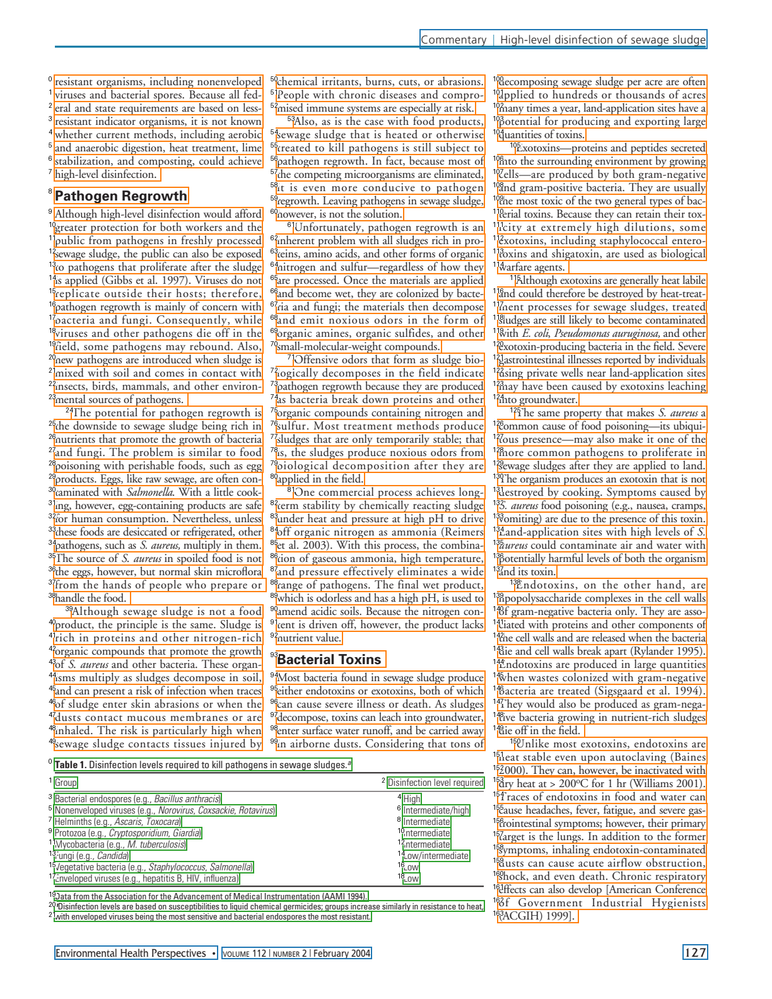

In [16]:
for page in show_annotations(docx.content, [tb for _,tb in lines_p_cp])[1:]:
        display(page)
        break

Page 3 train

In [17]:
for page_num in range(len(docx.pages)):    
    content_boxes_p = [tb for tb in docx.content_boxes if tb.page_num==page_num]
    #content_boxes_p = sorted(content_boxes_p, key=lambda b: (b.page_num, b.y0, b.x0))

    content_boxes_p_gold = [tb for tb in doc.content_boxes if tb.page_num==page_num]
    #content_boxes_p_gold = sorted(content_boxes_p_gold, key=lambda b: (b.page_num, b.y0, b.x0))
    
    for gl_rank, (tb,gold) in enumerate(zip(content_boxes_p,content_boxes_p_gold)):
        tb.rank = f"{gl_rank}->{tb.label.split('|')[3]}"
        tb.label = tb.label.split('|')[0]
        tb.bg_color = 'cyan'
        #print(f"  {gl_rank:3d}  ->  {tb.label.split('|')[3]:>3s} : {tb.label:20} : {tb.text[:30]:>30s} - {gold.text[:30]:<30s}")


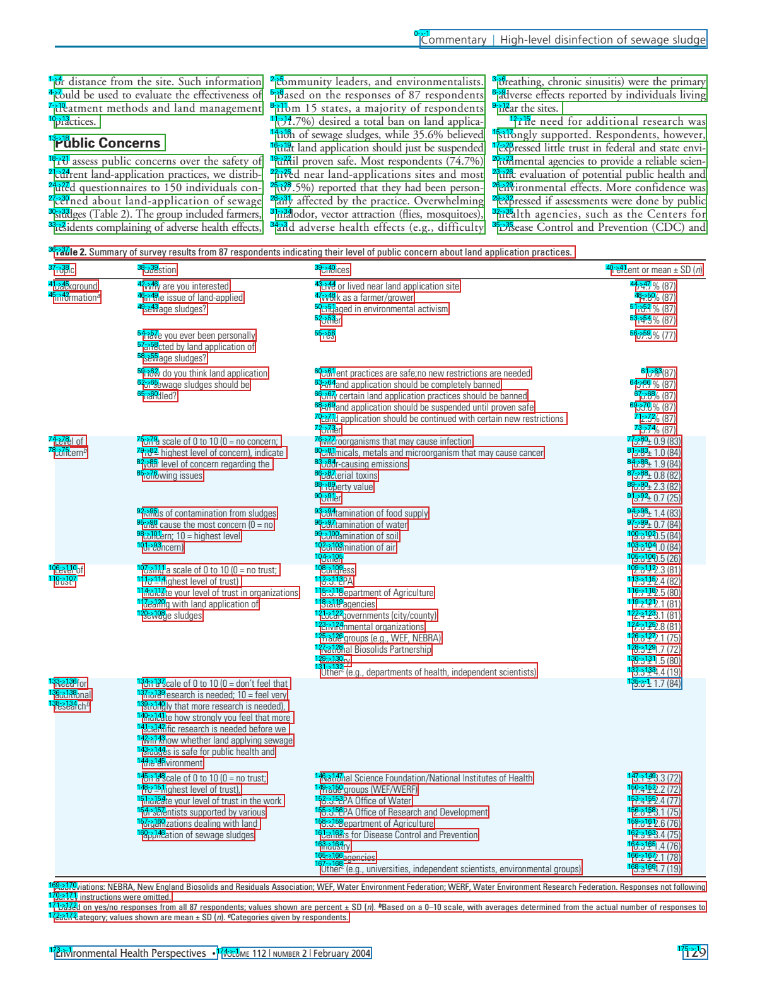

In [18]:
for page in show_annotations(docx.content, docx.content_boxes)[3:]:
        display(page)
        break

In [21]:
for page in docx.pages[3:]:
    lines_p = [(n,tb) for (n,tb) in enumerate(page.text_boxes)]
    debs = [True for _ in lines_p]
    for n,tb in lines_p:
        suc = int(tb.label.split('|')[3])
        if suc == -1:
            debs[n] = False
        else:
            debs[suc] = False
    debs = [n for (n,v) in enumerate(debs) if v]
    if len(debs)<1:
        print("Page only pollution")
        continue
    ideb = 0
    deb = debs[ideb]
    pred = deb
    orders = {}
    order_pred2suc, order_suc2pred = {},  {}
    
    while True:
        _p, tb = lines_p[pred]
        assert _p == pred
        suc = int(tb.label.split('|')[3])
        assert suc != -1, "doit pas contenir de line pollution"
        
        # circuit
        if suc in order_pred2suc:
            #if deb == 48:
            #    print('DEB 48')
            #    print(order_pred2suc)
            orders[deb] = (order_pred2suc, order_suc2pred)
            ideb += 1
            if ideb >= len(debs):
                break # end
            deb = debs[ideb]
            pred = deb
            order_pred2suc, order_suc2pred = {},  {}
        else:
            c = False
            deb2, order_pred2suc2, order_suc2pred2 = None, None, None
            for _deb in orders:
                #print("DEB", _deb)
                _order_pred2suc, _order_suc2pred = orders[_deb]
                # croisement avec une autre tête(debut)
                if suc in _order_pred2suc:
                    c = True
                    deb2, order_pred2suc2, order_suc2pred2 = _deb, _order_pred2suc, _order_suc2pred
                    break
            # traiter croisement
            if c:
                # Merge des deux ordres (la première considérée prioritaire heuristique)
                pred2 = order_suc2pred2[suc]
                order_pred2suc2[pred2] = deb
                order_suc2pred2[deb] = pred2
                
                order_pred2suc2[pred] = suc
                order_suc2pred2[suc] = pred
                
                # merge
                #if deb == 84:
                #    print('DEB 84')
                #    print(order_pred2suc)
                #    print(order_pred2suc2)
                order_pred2suc |= order_pred2suc2
                order_suc2pred |= order_suc2pred2
                
                # retirer order_pred2suc et 
                if deb in orders:
                    del(orders[deb])
                deb = deb2
                orders[deb] = (order_pred2suc, order_suc2pred)
            else:
                order_pred2suc[pred] = suc
                order_suc2pred[suc] = pred
                pred = suc
    # regroupement par type
    orders_type = {}
    for it,deb in enumerate(orders):
        #print(f'Regroupement {1+it}/{len(orders)} - {len(lines_p)}')
        order_pred2suc = orders[deb][0]
        liste_or = [deb]
        cur = deb
        while True:
            #print('cur',cur)
            suc = order_pred2suc[cur]
            if suc in liste_or:
                break
            liste_or.append(suc)
            if suc not in order_pred2suc:
                break
            cur = suc

        
        _d, tb = lines_p[deb]
        #print(deb, _d)
        assert _d == deb, "same line number assert"
        t = tb.label.split('|')[0]
        if t not in orders_type:
            orders_type[t] = liste_or
        else:
            orders_type[t].extend(liste_or)
    break # page 1

In [22]:
lines_p_cp = deepcopy(lines_p)
for t in orders_type:
    t_lines = orders_type[t]
    for r,num in enumerate(t_lines):
        _num, tb = lines_p_cp[num]
        assert _num==num, 'assert same num'
        tb.rank = f'{r}'
        tb.label = tb.label.split('|')[0]

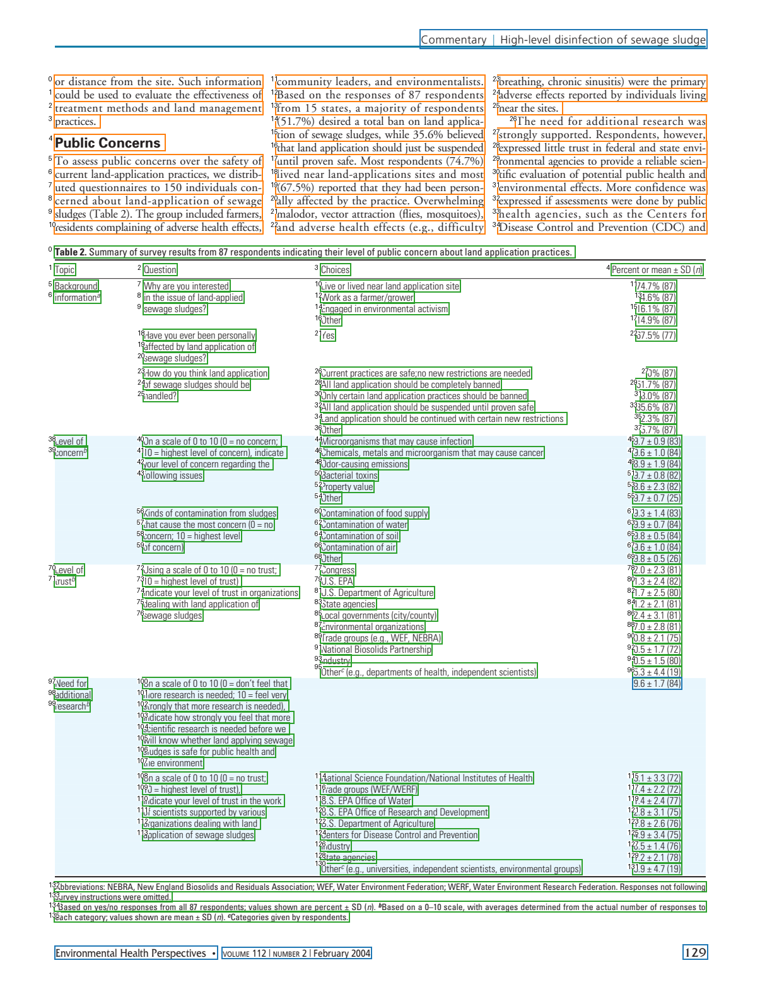

In [23]:
for page in show_annotations(docx.content, [tb for _,tb in lines_p_cp])[3:]:
        display(page)
        break

# Doc de test MC1257610

Nb Pages 5


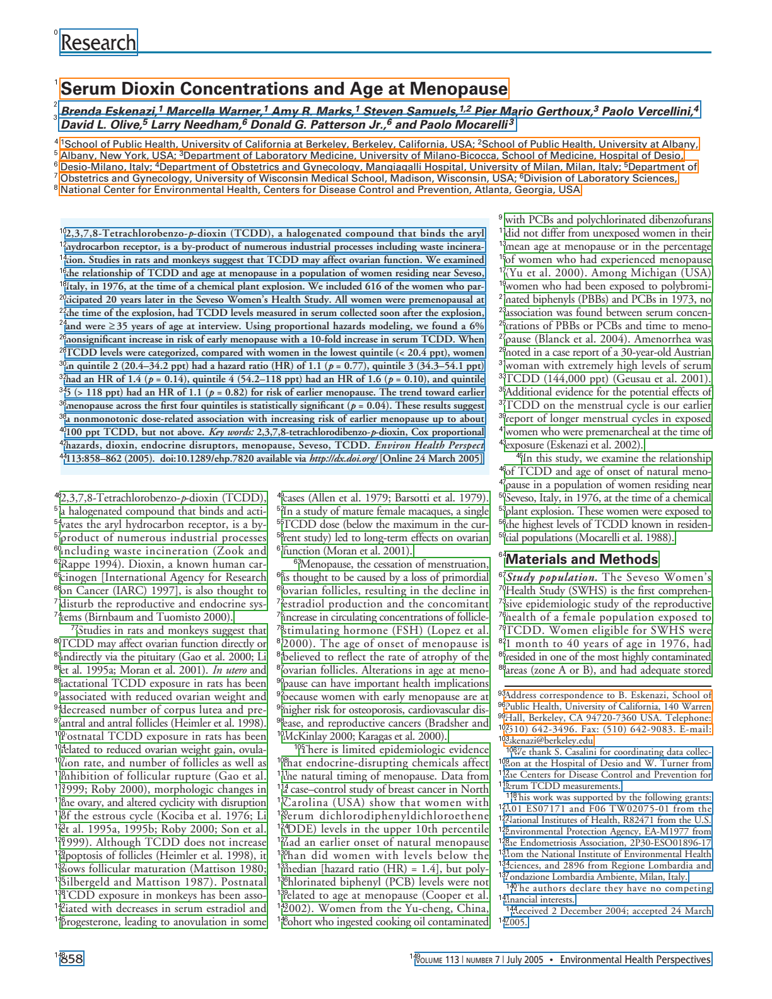

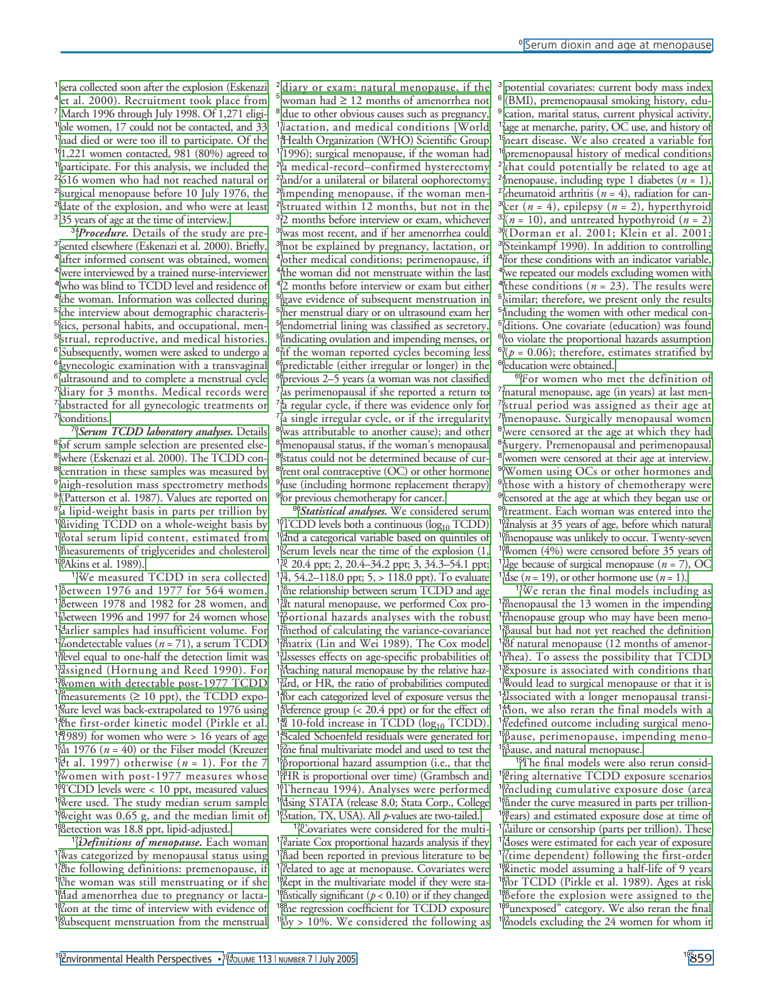

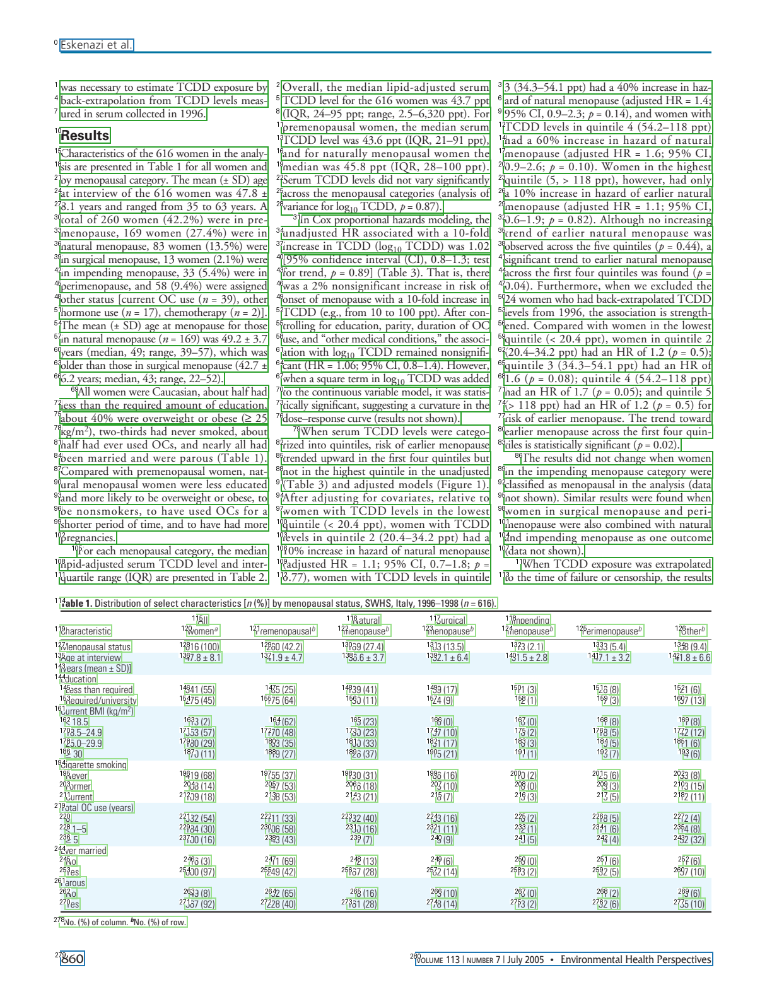

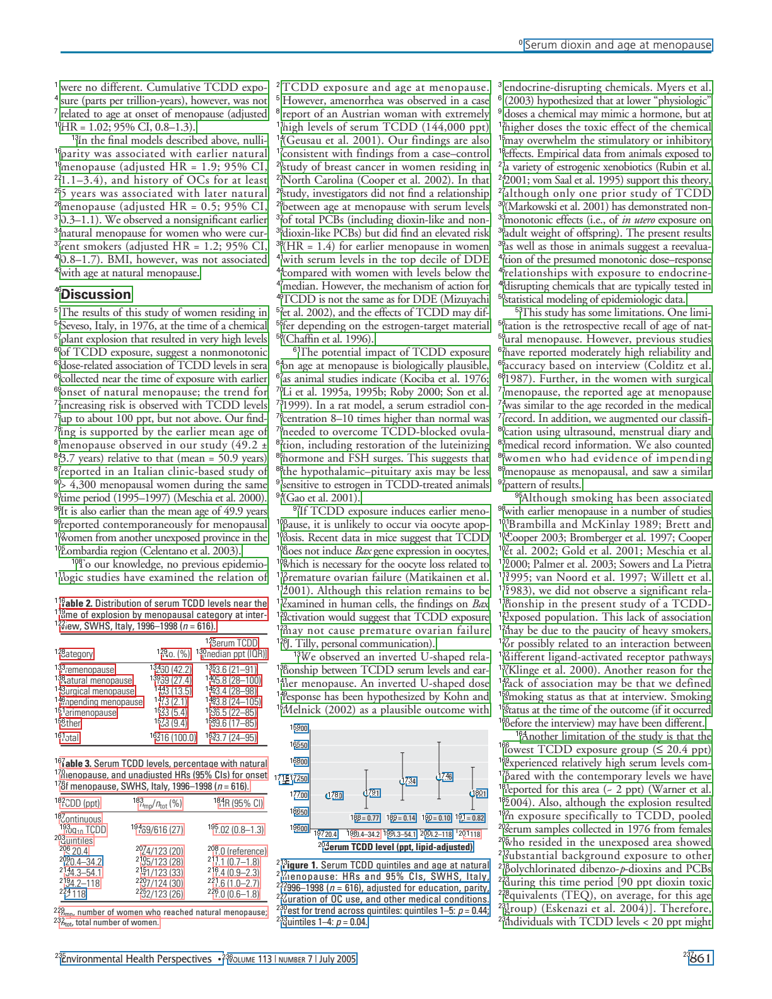

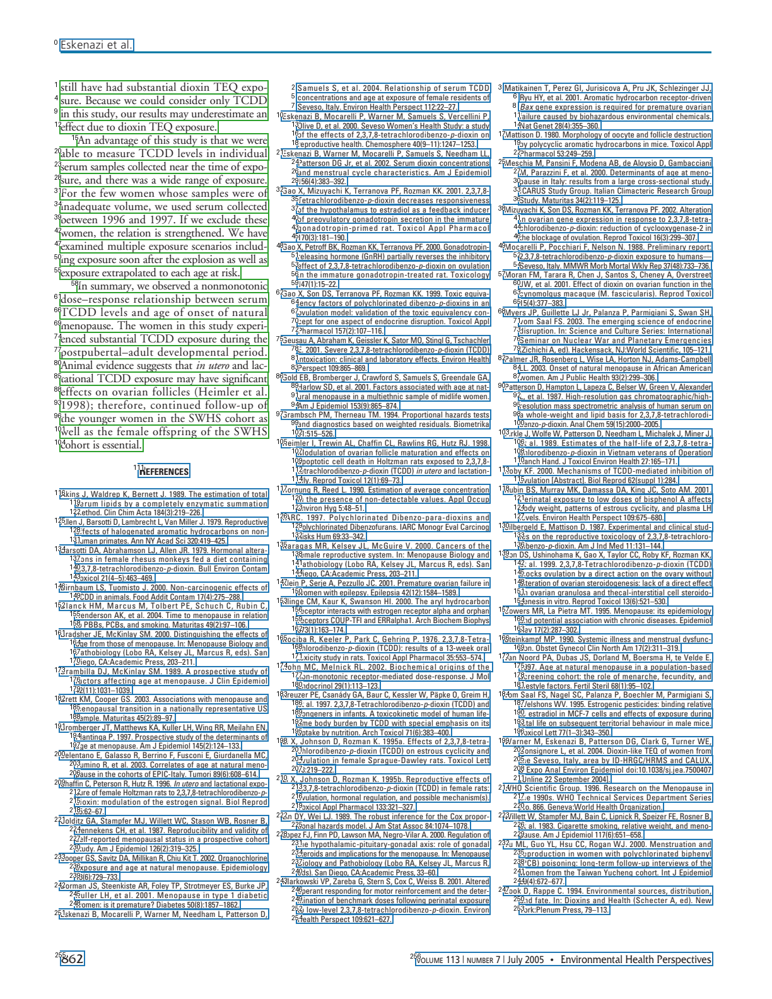

In [49]:
# test
pmc_dir = '../../edspdf-train/data/publaynet/train/PMC1257646/'

doc = read_pdf_with_pkl(pmc_dir)

In [50]:
model.select_pipes(disable=["extractor"])
docx = model(deepcopy(doc))

## Page 2 test

In [51]:
for page in docx.pages[2:]:
    lines_p = [(n,tb) for (n,tb) in enumerate(page.text_boxes)]
    debs = [True for _ in lines_p]
    for n,tb in lines_p:
        suc = int(tb.label.split('|')[3])
        if suc == -1:
            debs[n] = False
        else:
            debs[suc] = False
    debs = [n for (n,v) in enumerate(debs) if v]
    if len(debs)<1:
        print("Page only pollution")
        continue
    ideb = 0
    deb = debs[ideb]
    pred = deb
    orders = {}
    order_pred2suc, order_suc2pred = {},  {}
    
    while True:
        _p, tb = lines_p[pred]
        assert _p == pred
        suc = int(tb.label.split('|')[3])
        assert suc != -1, "doit pas contenir de line pollution"
        
        # circuit
        if suc in order_pred2suc:
            #if deb == 48:
            #    print('DEB 48')
            #    print(order_pred2suc)
            orders[deb] = (order_pred2suc, order_suc2pred)
            ideb += 1
            if ideb >= len(debs):
                break # end
            deb = debs[ideb]
            pred = deb
            order_pred2suc, order_suc2pred = {},  {}
        else:
            c = False
            deb2, order_pred2suc2, order_suc2pred2 = None, None, None
            for _deb in orders:
                #print("DEB", _deb)
                _order_pred2suc, _order_suc2pred = orders[_deb]
                # croisement avec une autre tête(debut)
                if suc in _order_pred2suc:
                    c = True
                    deb2, order_pred2suc2, order_suc2pred2 = _deb, _order_pred2suc, _order_suc2pred
                    break
            # traiter croisement
            if c:
                # Merge des deux ordres (la première considérée prioritaire heuristique)
                pred2 = order_suc2pred2[suc]
                order_pred2suc2[pred2] = deb
                order_suc2pred2[deb] = pred2
                
                order_pred2suc2[pred] = suc
                order_suc2pred2[suc] = pred
                
                # merge
                #if deb == 84:
                #    print('DEB 84')
                #    print(order_pred2suc)
                #    print(order_pred2suc2)
                order_pred2suc |= order_pred2suc2
                order_suc2pred |= order_suc2pred2
                
                # retirer order_pred2suc et 
                if deb in orders:
                    del(orders[deb])
                deb = deb2
                orders[deb] = (order_pred2suc, order_suc2pred)
            else:
                order_pred2suc[pred] = suc
                order_suc2pred[suc] = pred
                pred = suc
    # regroupement par type
    orders_type = {}
    for it,deb in enumerate(orders):
        #print(f'Regroupement {1+it}/{len(orders)} - {len(lines_p)}')
        order_pred2suc = orders[deb][0]
        liste_or = [deb]
        cur = deb
        while True:
            #print('cur',cur)
            suc = order_pred2suc[cur]
            if suc in liste_or:
                break
            liste_or.append(suc)
            if suc not in order_pred2suc:
                break
            cur = suc

        
        _d, tb = lines_p[deb]
        #print(deb, _d)
        assert _d == deb, "same line number assert"
        t = tb.label.split('|')[0]
        if t not in orders_type:
            orders_type[t] = liste_or
        else:
            orders_type[t].extend(liste_or)
    break # page 1

In [52]:
lines_p_cp = deepcopy(lines_p)
for t in orders_type:
    t_lines = orders_type[t]
    for r,num in enumerate(t_lines):
        _num, tb = lines_p_cp[num]
        assert _num==num, 'assert same num'
        tb.rank = f'{r}'
        tb.label = tb.label.split('|')[0]

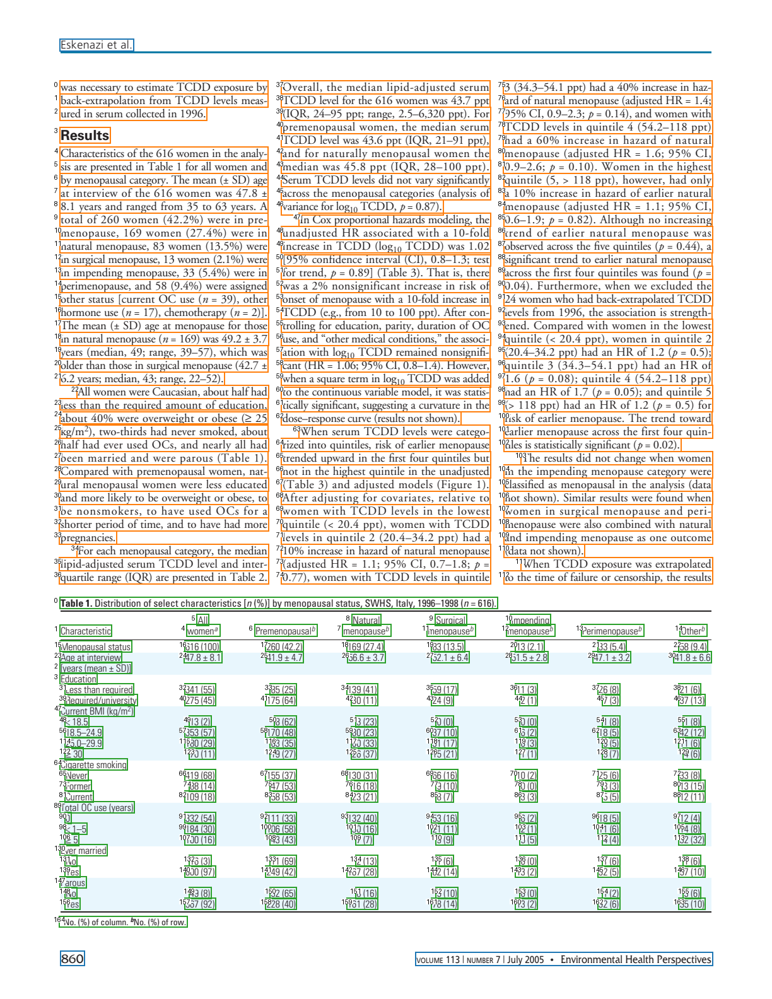

In [53]:
for page in show_annotations(docx.content, [tb for _,tb in lines_p_cp])[2:]:
        display(page)
        break